<a href="https://colab.research.google.com/github/mbaliu-treino/Desenvolve/blob/main/LEARN_C_DS_VC_Classificacao_de_faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font color=orange><b>Análise e Classificação de Faces: visão Computacional com OpenCV</b></font>

<font color=gray size=2><a href="https://colab.research.google.com/drive/1GmuhJfaGYBLscfKt5arSnNWBJ4U63vgJ">Arquivo Colab</a></font>
<!--- Para indicar o arquivo a ser trabalhado a partir do Github, sem ter que criar uma nova cópias --->


<ul><font size=2 color=gray><b>FICHA TÉCNICA</b>
<li><a href="https://cursos.alura.com.br/course/analise-classificacao-faces-visao-computacional-opencv"><font size=2 color=gray>Análise e Classificação de Faces: visão Computacional com OpenCV</a>
<li>Carga Horária: 10 h
<li>Instrutora: Michel Fernandes
<li>Data de Início: 10-2022
</ul>


<hr color=gray><br>

* [Paper da Cascata de Haar](https://www.cs.cmu.edu/~efros/courses/LBMV07/Papers/viola-cvpr-01.pdf)

<!-- DESCRIÇÃO DOS TÓPICOS APRENDIDOS -->
<h3><b>Conteúdo / Aprendizagem:</b></h3>

- Ser capaz de extrair regiões de interesse de uma imagem.
- Normalizar e pré-processar conjunto de dados de imagens.
- Construir classificadores para reconhecimento de faces.
- Validar a precisão do modelo construído para posterior aplicação em aplicações do mundo real.
- Extrair regiões do rosto humano baseado em marcos faciais.
- Criar aplicações que analise diferentes condições de cada componente do rosto humano.

* O que são regiões de interesse (do inglês ROI, Region Of Interest);
* Como as regiões de interesse ajudam a simplificar problemas de classificação de imagens;
* Manipular regiões de interesse para aplicar conversões de espaços de cores diferentes.
* Como funcionam os classificadores em cascata de Haar.
* Aplicar o classificador de faces frontais e como utilizá-los para extrair regiões de interesse de faces de uma imagem.
* Como diferentes parâmetros de configuração, como número de vizinhos mínimos e escala de imagem podem influenciar na detecção de objetos com os classificadores em cascata de Haar.
* A importância do pré-processamento de dados antes de treinar classificadores de aprendizado de máquina.
* Técnicas de mover arquivos de pastas diferentes para dividi-las em treinamento e testes para posterior etapa de treinamento e validação.
* Como redimensionar as imagens utilizando um interpolador que minimiza efeitos de artefatos em imagens que são ampliadas.
* Funcionamento e aplicação de cada um dos algoritmos de classificação de faces Eingenfaces, Fisherfaces e LBPH.
* Entendimento do processo de treinamento de cada algoritmo.
* Interpretação do resultado das inferências de cada algoritmo, em especial os valores de similaridade.
* Comparação de acurácia e estudo benchmark entre os algoritmos.
* Como funciona a biblioteca DLib para detectar faces e extrair marcos faciais.
* Extração dos marcos faciais utilizando o modelo treinado em 68 pontos.
* Inspeção de regiões de rosto para leituras de medidas e identificação de comportamentos voltados a abertura da boca e dos olhos.
* Conceitos de aspecto de razão.
* Como realizar processamento e análise de vídeos.
* Desenvolvimento de casos de uso que aplicam os conceitos de análise de marcos faciais.

# <font color=orange>RESUMO</font>
<!-- DESCRIÇÃO DO PROCESSO DE PROCESAMENTO -->

<a href=https://docs.google.com/spreadsheets/d/1tTygYlq9r7nkUsw9a25N5_z57-de_59tSBCIVPw6KUw><font size=2 color=gray>ROTEIROS Data Science</font></a><!-- Planilha de roteiros para Data Science -->

* <font color=orange><b>

* [Twitter Endpoints](https://docs.tweepy.org/en/stable/api.html#api-reference)

# <font color=orange>**CURSO**</font>
<!-- Descrição do projeto a ser realizado -->

**Projeto**: 


<!-- Material final oferecido no curso -->
<a href="https://github.com/alura-cursos/alura-analise-facial/tree/aula_6"><font size=2; color=gray>Material de referencial do curso</a></font>


## 0 - Ambiente

Podemos criar ambientes virtuais para que os projetos não sejam impactados pela quantidade de bibliotecas instaladas.

In [ ]:
# !pip install opencv-python - já está instalado [atual: 4.6.0.66]

import cv2
import dlib
import seaborn as sns
import matplotlib.pyplot as plt

import urllib
from skimage import io
import numpy as np
from google.colab.patches import cv2_imshow

print('cv2:', cv2.__version__)
print('dlib:', dlib.__version__)
print('seaborn:', sns.__version__)

cv2: 4.6.0
dlib: 19.24.0
seaborn: 0.11.2


## 1 - Imagens

* O CV2 não consegue ler uma URL, mas somente arquivos binários.
* O método `io` do `skimage` consegue baixar a imagem da URL
* Também podemos fazer o download usando URLLIB ou Requests

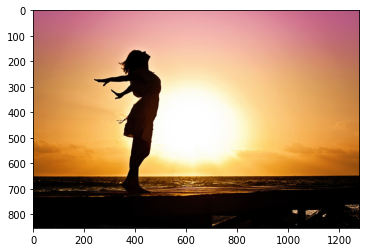

In [ ]:
 url_imagem = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_1/imagens/px-girl.jpg'

if True:
    imagem = io.imread(url_imagem)
    plt.imshow(imagem)
else:
    # --- alternative ----
    req = urllib.request.urlopen(url_imagem)
    arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
    imagem = cv2.imdecode(arr, -1) 
    cv2_imshow(imagem)

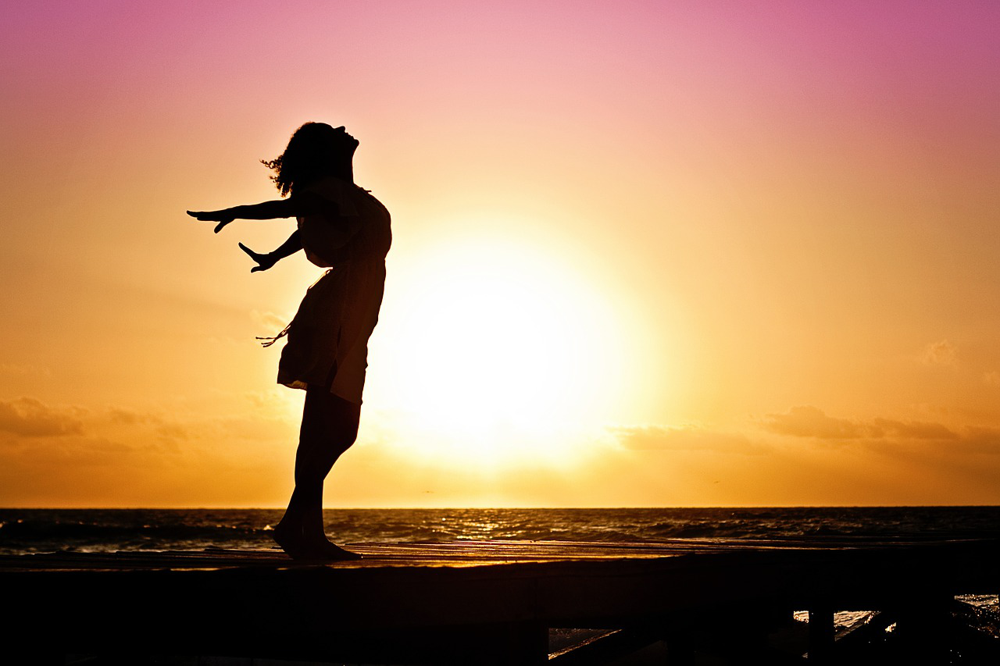

In [ ]:
imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
cv2_imshow(imagem_rgb)

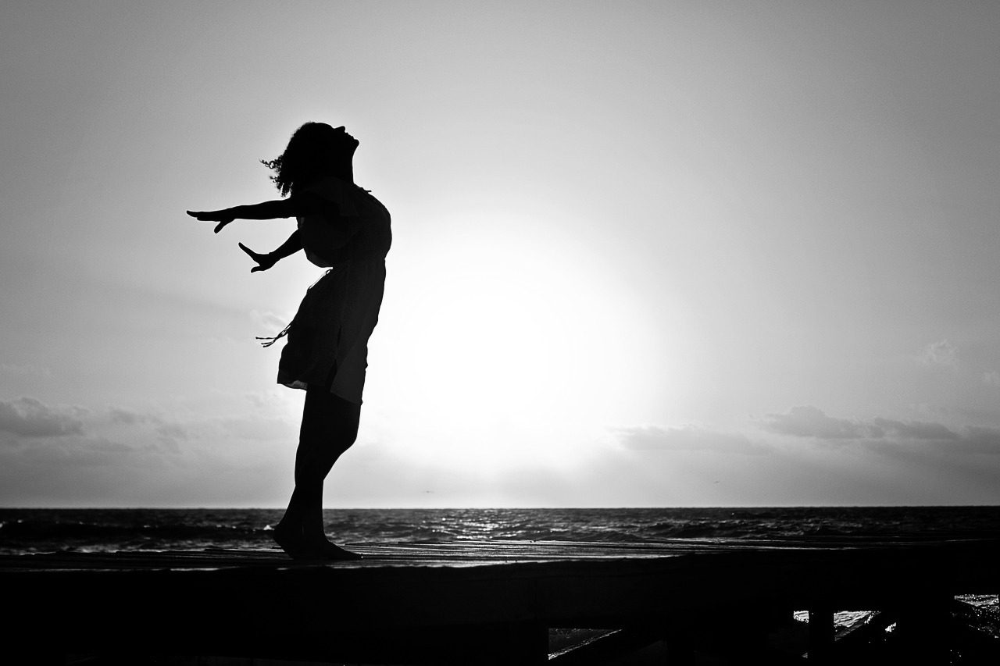

In [ ]:
# Conversão de cores
# imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
cv2_imshow(imagem_gray)

In [ ]:
# Complexidade da imagem
print('RGB:', imagem.shape)
print('GRAY:', imagem_gray.shape)

RGB: (853, 1280, 3)
GRAY: (853, 1280)


> A transformação para a escala é uma operação simples, pois somente soma e divide por 3 a intensidade de cada cor.

## 2 - Região de Interesse

É a área da imagem que possui os dados que interessa para o processamento, por exemplo, o rosto das pessoas em uma foto.

Para identificar a área de interesse (ROI) temos que ter cuidado com a simplicidade da imagem de interesse, para evitar a indicação de falso-positivos. Por exemplo, a identificação de vários sorrisos em uma imagem.

Nesses casos usamos uma téncica de classificação em cascata, em que primeiro é identificado um objeto maior, para depois identificar imagem dentro desta área de interesse. Isso simplifica a identificação dos objetos, ao mesmo tempo que melhora a acurácia da classifcação.

**Compreendendo o ROI**

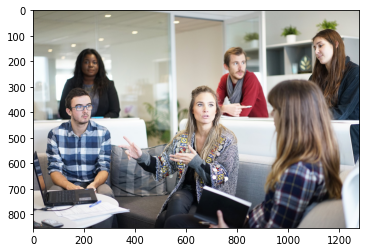

In [ ]:
url_imagem = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_1/imagens/px-people.jpg'

imagem = io.imread(url_imagem)
plt.imshow(imagem)

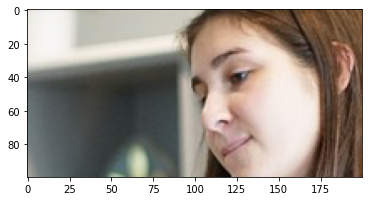

In [ ]:
imagem_roi = imagem[100:200, 1000:1200]
plt.imshow(imagem_roi)

In [ ]:
# Escrver imagem
imagem_roi_bgr = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite('imagem_roi.png', imagem_roi_bgr)

True

**PRATICANDO O ROI**

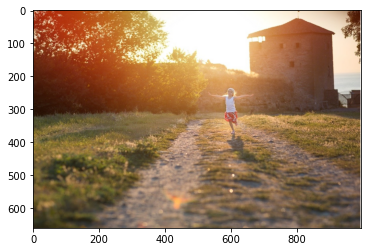

In [ ]:
# Carregando a imagem
url_imagem = 'https://caelum-online-public.s3.amazonaws.com/1364-visao-computacional-analise-facial/01/1364-img0102.png'

imagem = io.imread(url_imagem)
imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_RGBA2RGB)
plt.imshow(imagem_rgb)

In [ ]:
imagem_rgb.shape

(660, 995, 3)

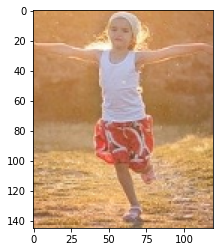

In [ ]:
# Seleção do corpo
imagem_roi = imagem_rgb[235:380, 540:660]
plt.imshow(imagem_roi)

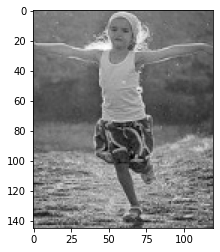

In [ ]:
imagem_roi_gray = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2GRAY)
plt.imshow(imagem_roi_gray, cmap="gray")

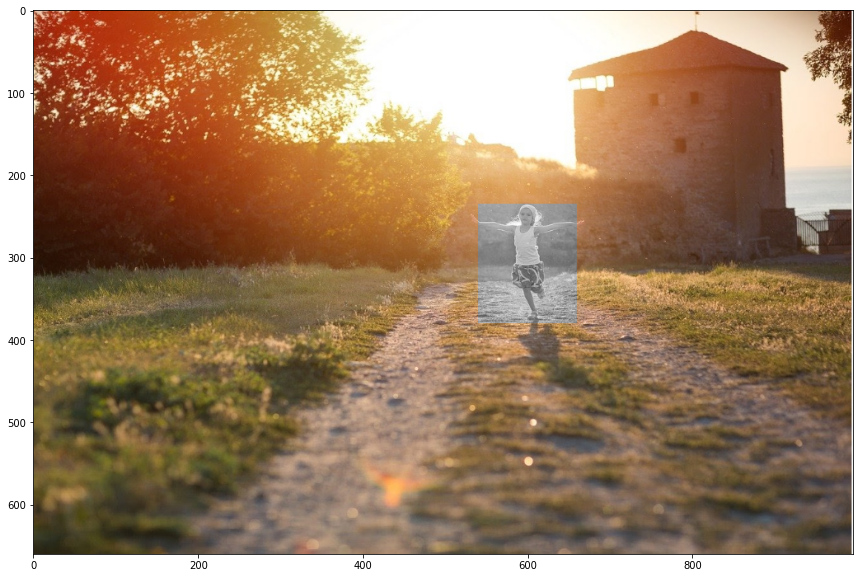

In [ ]:
roi_rgb = cv2.cvtColor(imagem_roi_gray, cv2.COLOR_GRAY2RGB)
imagem_comp = imagem_rgb
imagem_comp[235:380, 540:660] = roi_rgb

plt.figure(figsize=(20,10))
plt.imshow(imagem_comp)

## 3 - Classificação de Cascata de Haar

* O modelo precisa ser robusto o suficiente para identificar rostos em perspectiva
* Ele opera com um quadrado deslizante pela imagem, buscando identificar algumas características.
* As características buscadas são através dos filtros de comportamento das cores
* O `scaleFactor` irá diminuir este quadrado em cada ciclo;
* O conceito de `pareidolia` é um termo para segmentos que imagens que possuem as mesmas características procuradas (o mesmo padrão), engando o modelo e causando um falso-positivo (imagens negativas).

[Opções de modelos treinados](https://github.com/opencv/opencv/tree/master/data/haarcascades)

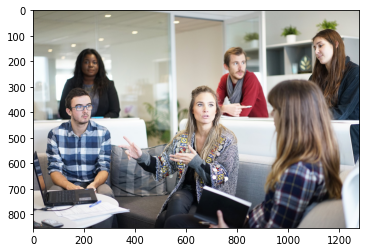

In [ ]:
url_imagem = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_1/imagens/px-people.jpg'

imagem = io.imread(url_imagem)
plt.imshow(imagem)

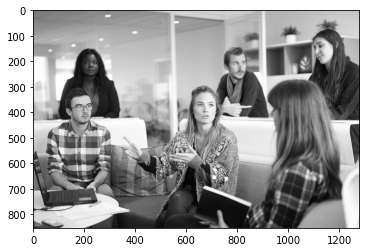

In [ ]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
plt.imshow(imagem_gray, cmap='gray')

### Analisando uma face

In [ ]:
# Classificador para rostos frontais
root_path = '/usr/local/lib/python3.7/dist-packages/cv2/'

classificador = cv2.CascadeClassifier(root_path+'data/haarcascade_frontalface_default.xml')

In [ ]:
faces = classificador.detectMultiScale(imagem_gray, 
                                       scaleFactor=1.3,
                                       minNeighbors=5)

In [ ]:
len(faces)

5

In [ ]:
# Objeto de faces - xo, yo, width, height
faces[0]

array([189, 175,  75,  75], dtype=int32)

### Representação das faces identificadas

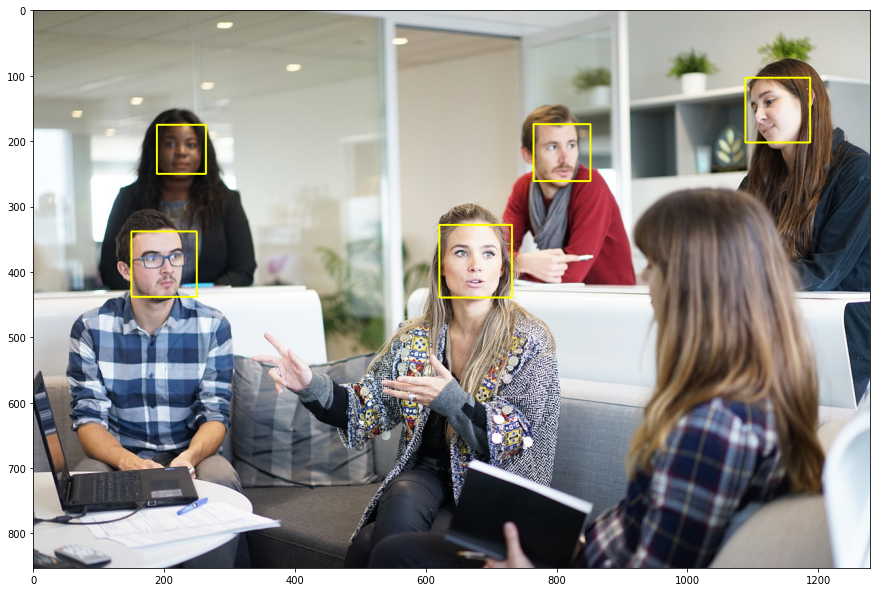

In [ ]:
# Desenhando retangulos
imagem_anotada = imagem.copy()

for (x, y, w, h) in faces:
    cv2.rectangle(imagem_anotada,
                  (x,y),
                  (x+w, y+h),
                  color=(255,255,0),
                  thickness=2)

plt.figure(figsize=(15,15))
plt.imshow(imagem_anotada)

### Salvando imagens das faces

In [ ]:
# Salvando imagens das faces
face_imagem = 0

for (x, y, w, h) in faces:
    face_imagem += 1
    imagem_roi = imagem[y:y+h, x:x+w]
    imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite('face_' + str(face_imagem) + '.png', imagem_roi)

### Exercício de ROI

* Recorte somente da face

<h4> Case 1

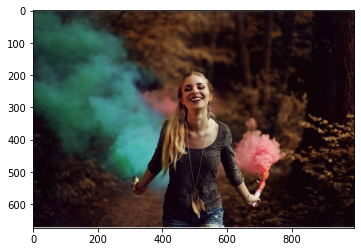

In [ ]:
# Case 1
url_img_1 = 'https://caelum-online-public.s3.amazonaws.com/1364-visao-computacional-analise-facial/02/1364-img0203.png'
img_1 = io.imread(url_img_1)
plt.imshow(img_1)

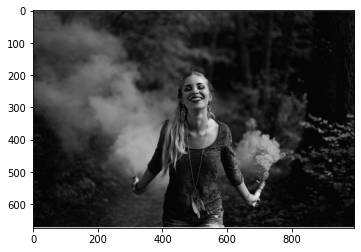

In [ ]:
# Desaturação da imagem
img_1_gray = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
plt.imshow(img_1_gray, cmap='gray')

In [ ]:
# Classificador para rostos frontais
root_path = '/usr/local/lib/python3.7/dist-packages/cv2/'
classificador = cv2.CascadeClassifier(root_path+'data/haarcascade_frontalface_default.xml')

faces_1 = classificador.detectMultiScale(
    image=img_1_gray,
    scaleFactor=1.3, 
    minNeighbors=5
)
len(faces_1)

1

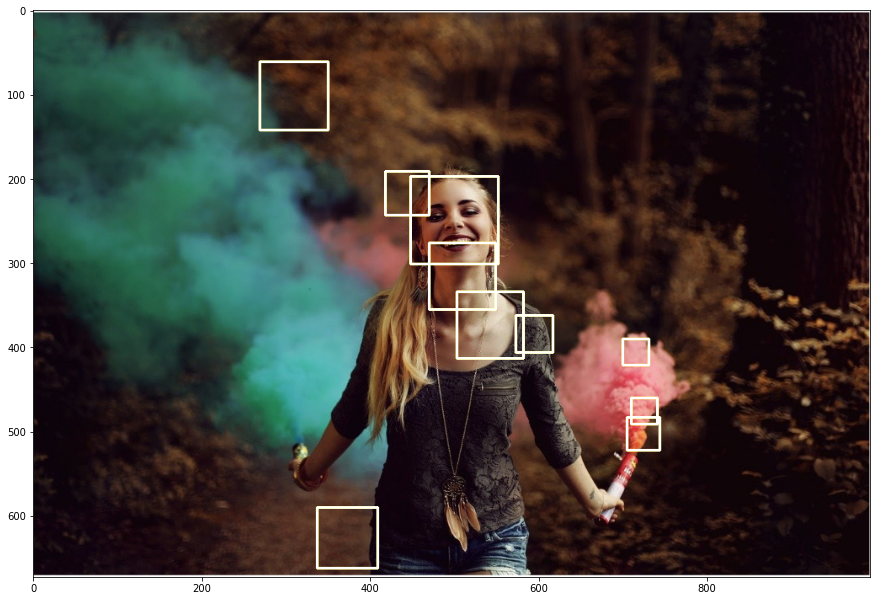

In [ ]:
# Visualização do quadro
img_anotada = img_1.copy()

for (x, y, w, h) in faces_1:
    cv2.rectangle(img_anotada,
                  (x,y),
                  (x+w, y+h),
                  color=(255,255,0),
                  thickness=2)

plt.figure(figsize=(15,15))
plt.imshow(img_anotada)

Quanto menor o `scaleFactor` maior será a probabilidade de ocorrência de **falso-positivos**. Como por exemplo na imagem acima, que foi encontrados 10 entidades, sendo que só há uma única face. Na demais, foi identificado o mesmo padrão, apesar de não se tratar de uma face. O melhor resultado foi obtido com escala = 1.3 ou 1.1, em que foi localizada a somente a face esperada.

<h4> Case 2

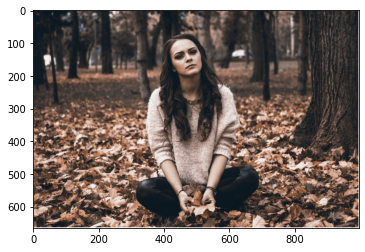

In [ ]:
# Case 2
url_img_2 = 'https://caelum-online-public.s3.amazonaws.com/1364-visao-computacional-analise-facial/02/1364-img0204.png'
img_2 = io.imread(url_img_2)
plt.imshow(img_2)

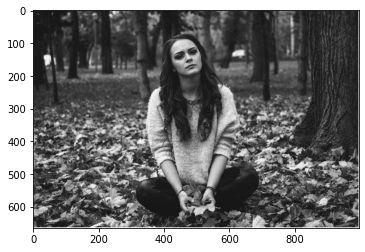

In [ ]:
# Desaturação da imagem
img_2_gray = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)
plt.imshow(img_2_gray, cmap='gray')

In [ ]:
# Classificador para rostos frontais
root_path = '/usr/local/lib/python3.7/dist-packages/cv2/'
classificador = cv2.CascadeClassifier(root_path+'data/haarcascade_frontalface_default.xml')

faces_2 = classificador.detectMultiScale(
    image=img_2_gray,
    scaleFactor=1.3, 
    minNeighbors=5
)
len(faces_2)

1

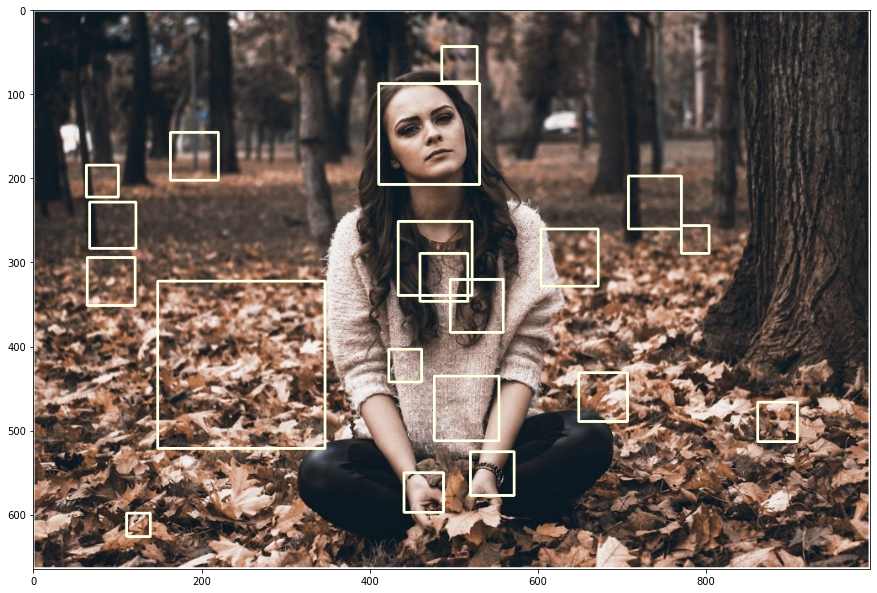

In [ ]:
# Visualização do quadro
img_anotada = img_2.copy()

for (x, y, w, h) in faces_2:
    cv2.rectangle(img_anotada,
                  (x,y),
                  (x+w, y+h),
                  color=(255,255,0),
                  thickness=2)

plt.figure(figsize=(15,15))
plt.imshow(img_anotada)

* `scaleFactor`
    * 1.01 → 20 faces
    * 1.1 → 2 faces
    * 1.2 → 1 face
    * 1.825 → 1 face

<h4> Case 3

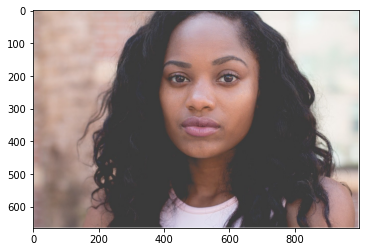

In [ ]:
# Case 3
url_img_3 = 'https://caelum-online-public.s3.amazonaws.com/1364-visao-computacional-analise-facial/02/1364-img0202.png'
img_3 = io.imread(url_img_3)
plt.imshow(img_3)

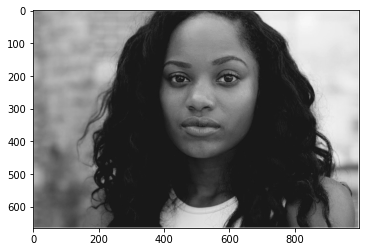

In [ ]:
# Desaturação da imagem
img_3_gray = cv2.cvtColor(img_3, cv2.COLOR_BGR2GRAY)
plt.imshow(img_3_gray, cmap='gray')

In [ ]:
# Classificador para rostos frontais
root_path = '/usr/local/lib/python3.7/dist-packages/cv2/'
classificador = cv2.CascadeClassifier(root_path+'data/haarcascade_frontalface_default.xml')

faces_3 = classificador.detectMultiScale(
    image=img_3_gray,
    scaleFactor=1.3, 
    minNeighbors=5
)
len(faces_3)

1

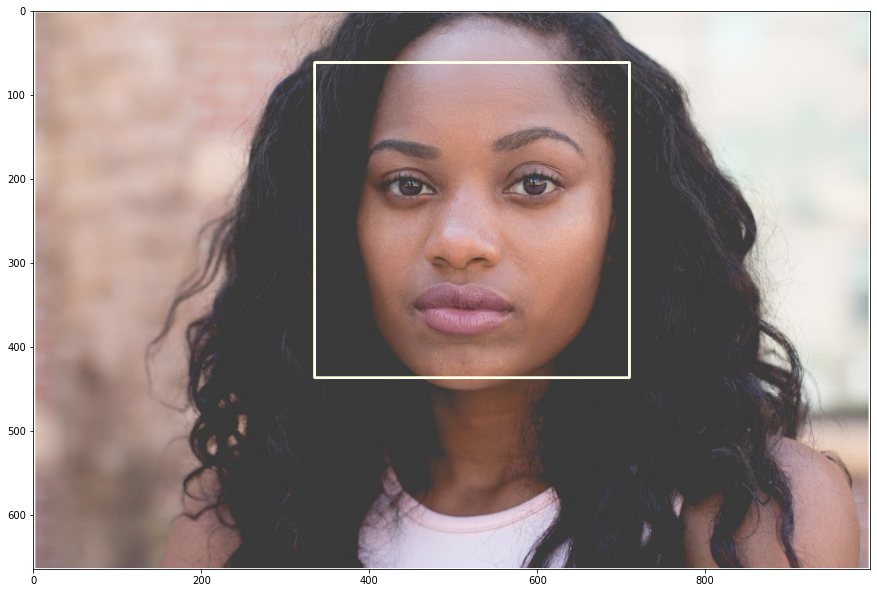

In [ ]:
# Visualização do quadro
img_anotada = img_3.copy()

for (x, y, w, h) in faces_3:
    cv2.rectangle(img_anotada,
                  (x,y),
                  (x+w, y+h),
                  color=(255,255,0),
                  thickness=2)

plt.figure(figsize=(15,15))
plt.imshow(img_anotada)

* `scaleFactor`
    * 1.01 → 4 faces
    * 1.1 → 2 faces
    * 1.2 → 1 face
    * 2.5 → 1 face
    * 3 → 0 face

<h4> ROI

In [ ]:
# ROI
for (x,y,w,h) in faces_1:
    roi_1 = img_1[y:y+h, x:x+w]

for (x,y,w,h) in faces_2:
    roi_2 = img_2[y:y+h, x:x+w]

for (x,y,w,h) in faces_3:
    roi_3 = img_3[y:y+h, x:x+w]

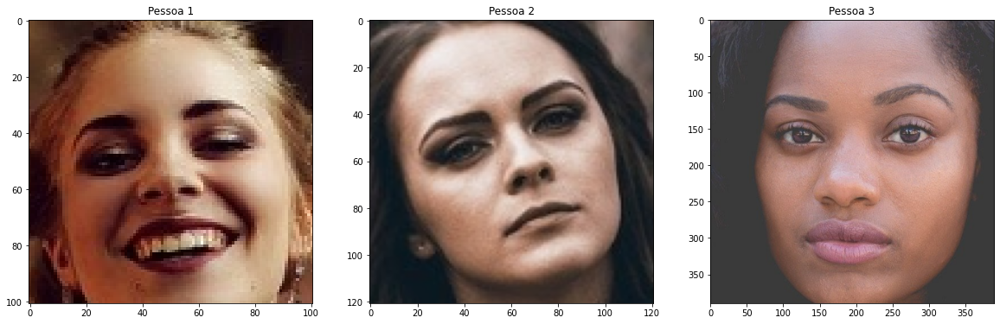

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.title("Pessoa 1")
plt.imshow(roi_1)

plt.subplot(132)
plt.title("Pessoa 2")
plt.imshow(roi_2)

plt.subplot(133)
plt.title("Pessoa 3")
plt.imshow(roi_3)

plt.show()

## 4 - Classificação de Faces

A classificação de fases é a operação de identificar a quem cada face pertence. Para isso, será necessário termos exemplos de dados classificados, para que sirvam para o treinamento, o teste e a validação.

Neste exercícios usaremos os dados da Georgia Tech, que contém 15 imagens para cada pessoa.

### 4.1 - Pré-Processamento

Os rostos usados para o treinamento já foram segmentados, então não será preciso processar a Cascata de Haar para extrair as faces dos dados de treinamento, caso contrário, teríamos que realizar esta extração.

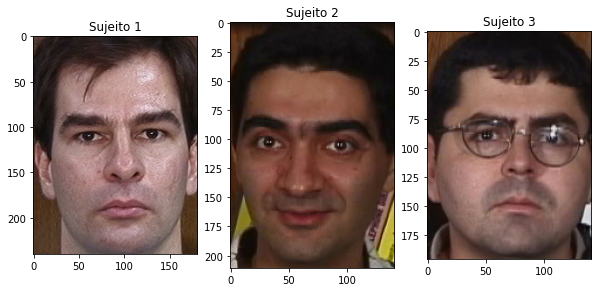

In [ ]:
# Exemplo dos dados
url_img_1 = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_3/imagens/cropped_faces/s01_01.jpg'
imagem_face_1 = io.imread(url_img_1)
# plt.imshow(imagem_face_1)

url_img_2 = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_3/imagens/cropped_faces/s02_01.jpg'
imagem_face_2 = io.imread(url_img_2)
# plt.imshow(imagem_face_2)

url_img_3 = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_3/imagens/cropped_faces/s03_01.jpg'
imagem_face_3 = io.imread(url_img_3)
# plt.imshow(imagem_face_3)

plt.figure(figsize=(10,20))
plt.subplot(131)
plt.title('Sujeito 1')
plt.imshow(imagem_face_1)

plt.subplot(132)
plt.title('Sujeito 2')
plt.imshow(imagem_face_2)

plt.subplot(133)
plt.title('Sujeito 3')
plt.imshow(imagem_face_3)

**CONCLUSÕES**

* As imagens possuem dimensões diferentes, o que dificulta a identificação das mesmas regiões.
    * Como solução devemos realizar a NORMALIZAÇÃO.

In [ ]:
# Experimentação da geração dos nomes das imagens
[f's01_{n:02}' for n in range(1, 16)]

['s01_01',
 's01_02',
 's01_03',
 's01_04',
 's01_05',
 's01_06',
 's01_07',
 's01_08',
 's01_09',
 's01_10',
 's01_11',
 's01_12',
 's01_13',
 's01_14',
 's01_15']

In [ ]:
# # Separação para treino e teste - Geração dos 750 nomes das imagens
nomes_imagens_treino = [f's{sujeito:02}_{n:02}' for n in range(1, 11) for sujeito in range(1,51)]
nomes_imagens_teste = [f's{sujeito:02}_{n:02}' for n in range(11, 16) for sujeito in range(1,51)]

len(nomes_imagens_teste) + len(nomes_imagens_treino)

150

In [ ]:
# Padronização das imagens - grayscale e redimensionamento
def padronizar_imagem(imagem_caminho):
    imagem = io.imread(imagem_caminho)
    imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)

    tamanho_padrao = (200,200)
    imagem_resized = cv2.resize(imagem_gray, tamanho_padrao, interpolation=cv2.INTER_LANCZOS4)
    return imagem_resized

In [ ]:
%%time
# Construção das listas com os dados para o treinamento e para o teste
dados_tratados, sujeitos = [], []
dados_tratados_teste, sujeitos_teste = [], []
url_dados = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_3/imagens/cropped_faces/'

for i, arq in enumerate(nomes_imagens_treino):
    imagem_path = url_dados + arq + '.jpg'
    imagem = padronizar_imagem(imagem_path)
    dados_tratados.append(imagem)
    sujeitos.append(int(arq[1:3]))

for i, arq in enumerate(nomes_imagens_teste):
    imagem_path = url_dados + arq + '.jpg'
    imagem = padronizar_imagem(imagem_path)
    dados_tratados_teste.append(imagem)
    sujeitos_teste.append(int(arq[1:3]))

CPU times: user 999 ms, sys: 146 ms, total: 1.14 s
Wall time: 20.3 s


> Com 20% dos dados, o processo levou: 20 segundos

In [ ]:
print(len(sujeitos), len(dados_tratados))
print(len(sujeitos_teste), len(dados_tratados_teste))

100 100
50 50


In [ ]:
dados_tratados[0].shape

(200, 200)

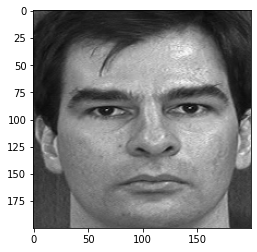

In [ ]:
plt.imshow(dados_tratados[0], cmap='gray')

#### Exercício de Pré-processamento

> Geralmente, o tamanho padrão é dado pelo classificador. Neste exemplo, vamos arbitrar um a partir da mediana das dimensões das 3 imagens, de altura e comprimento.

In [ ]:
# Medianas
median_height = np.median([roi_1.shape[0], roi_2.shape[0], roi_3.shape[0]])
median_width = np.median([roi_1.shape[1], roi_2.shape[1], roi_3.shape[1]])

In [ ]:
face_size = (162, 162)
rosto_1 = cv2.resize(roi_1, face_size, interpolation=cv2.INTER_LANCZOS4)
rosto_2 = cv2.resize(roi_2, face_size, interpolation=cv2.INTER_LANCZOS4)
rosto_3 = cv2.resize(roi_3, face_size, interpolation=cv2.INTER_LANCZOS4)

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.title("Pessoa 1")
plt.imshow(rosto_1)

plt.subplot(132)
plt.title("Pessoa 2")
plt.imshow(rosto_2)

plt.subplot(133)
plt.title("Pessoa 3")
plt.imshow(rosto_3)

plt.show()

In [ ]:
rosto_1_bgr = cv2.cvtColor(rosto_1, cv2.COLOR_RGB2BGR)
rosto_2_bgr = cv2.cvtColor(rosto_2, cv2.COLOR_RGB2BGR)
rosto_3_bgr = cv2.cvtColor(rosto_3, cv2.COLOR_RGB2BGR)

cv2.imwrite("face_1.png", rosto_1_bgr)
cv2.imwrite("face_2.png", rosto_2_bgr)
cv2.imwrite("face_3.png", rosto_3_bgr)

### 4.2 Algoritmos de Classificação de Faces

#### Eigenfaces

* Requisito: lista de array de int 32 bits

<h3>Como funciona o Eigenfaces na classificação?</h3>

* Ele utiliza o PCA (principal components analysis) para realização de redução dimensional, buscando maximizar a **VARIÂNICA** intra classes.
* Ele é muito sensível a diferenças de iluminação.

1. O modelo obtém uma média da face da pessoa.
2. Com o PCA é definido o que seriam fatores de identificação da pessoa, podendo da componente principal uma característica, como a barba, o cabelo etc.
    - O problema disso é que pessoas com as mesma característica (barba etc) se tornam próximas.


**Análise de similaridade**: identico = 0, discrepante=$\infty$.

In [ ]:
import numpy as np

In [ ]:
%%time
# Conversão para o formato de entrada exigida
sujeitos = np.array(sujeitos, dtype=np.int32)
sujeitos_teste = np.array(sujeitos_teste, dtype=np.int32)

# Instância
modelo_eigenfaces = cv2.face.EigenFaceRecognizer_create()

# Treinamento
modelo_eigenfaces.train(dados_tratados, sujeitos)

In [ ]:
# Exemplos de dados usados no treinamento
plt.figure(figsize=(20,10))

plt.subplot(121)
suj = 6
plt.title('Sujeito' + str(sujeitos_teste[suj]))
plt.imshow(dados_tratados[suj], cmpa='gray')

plt.subplot(122)
suj = 7
plt.title('Sujeito' + str(sujeitos_teste[suj]))
plt.imshow(dados_tratados[suj], cmpa='gray')

plt.show()

In [ ]:
# Predição - Sujeito 7
predicao = modelo_eigenfaces.predict(dados_tratados_teste[6])
predicao

* Verificação se trata do mesmo sujeito (pelo número)
* Valor da distância da predição

In [ ]:
# Predição - Sujeito 19
predicao = modelo_eigenfaces.predict(dados_tratados_teste[7])
predicao

#### FisherFaces

* Requisito: lista de array de int 32 bits

<h3>Como funciona o Fisherfaces na classificação?</h3>

* Ele consegue ser um pouco mais robusto do que outros algorítmos.
* Lida um pouco melhor com variação de iluminação, mas ainda é bem sensível.
* É um modelo bom para aprender sobre as expressões faciais.

- Usa o LDA (Linear Discriminant Analysis): maximiza a variância entre as classes.
- Ele busca maximizar as informações extra-classe (diferentes classes para classificar objetos distintos), e não os componentes ou informações dentro da própria classe.

In [ ]:
# Instância
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()
modelo_fisherfaces.train(dados_tratados, sujeitos)  # sujeitos em int32

# Predição - Sujeito 7
predicao = modelo_fisherfaces.predict(dados_tratados_teste[6])
predicao

In [ ]:
# Exemplos de dados usados no treinamento
plt.figure(figsize=(20,10))

plt.subplot(121)
suj = 13
plt.title('Sujeito' + str(sujeitos_teste[suj]))
plt.imshow(dados_tratados[suj], cmpa='gray')

plt.subplot(122)
suj = 19
plt.title('Sujeito' + str(sujeitos_teste[suj]))
plt.imshow(dados_tratados[suj], cmpa='gray')

plt.show()

In [ ]:
# Predição - Sujeito 5
predicao = modelo_fisherfaces.predict(dados_tratados_teste[13])
predicao

In [ ]:
# Predição - Sujeito 42
predicao = modelo_fisherfaces.predict(dados_tratados_teste[19])
predicao

#### LBPH

(Local Binary Pattern Histogram)

* Requisito: lista de array de int 32 bits

<h3>Como funciona o LBPH na classificação?</h3>

* É considerado um dos modelos mais robustos;
* Possui diversos filtros para eliminar o impacto da iluminação e até mesmo ruídos.

PROCESSO
- Ele analisa recortes de 3x3 pixels, comparando o valor central com o valor dos pixels adjacentes.
- Tendo isso, ele constroi um número binário.
- Juntando os inúmeros resultados é construído um histograma,
- Depois é comparado com outro histograma, buscando identificar a diferença por distância euclidiana.

Por construir o vetor através da comparação entre o pixel central e os seus adjacentes, ele consegue criar um filtro relativo, melhorando o desempenho em situações de iluminação diferentes.

> A operação de **limiarização de intensidade** atenua muito os efeitos de ruídos, como o de iluminação inadequada.

In [ ]:
# Instância
modelo_lbph = cv2.face.LBPHFaceRecognizer_create()
modelo_lbph.train(dados_tratados, sujeitos)  # sujeitos em int32

In [ ]:
# Exemplos de dados usados no treinamento
plt.figure(figsize=(20,10))

plt.subplot(121)
suj = 21
plt.title('Sujeito' + str(sujeitos_teste[suj]))
plt.imshow(dados_tratados[suj], cmpa='gray')

plt.subplot(122)
suj = 27
plt.title('Sujeito' + str(sujeitos_teste[suj]))
plt.imshow(dados_tratados[suj], cmpa='gray')

plt.show()

In [ ]:
# Predição
predicao = modelo_lbph.predict(dados_tratados_teste[21])
predicao

In [ ]:
# Predição
predicao = modelo_lbph.predict(dados_tratados_teste[27])
predicao

### Avaliação dos Modelos

A avaliação dos modelos é realizada através da acurácia, mas também também pode ser feita com o precisão e recall, dependendo do problema do negócio e qual tipo de erro é oferece maior risco ao negócio.

Na avaliação é interessante considerar o por quê cada modelo não se desempenhou tão bem. Quais os fatores na base de dados que levaram atais resultados.

**Estudo benchmarking**: é testar diversos modelos, mesmo que não seja esperado um bom resultado.

In [ ]:
from sklearn.metrics import accuracy_score

y_pred_eigenfaces = []
for item in dados_tratados_teste:
    sujeito = modelo_eigenfaces.predict(item)[0]
    y_pred_eigenfaces.append(sujeito)
acuracia_eigenfaces = accuracy_score(sujeitos_teste, y_pred_eigenfaces)

y_pred_fisherfaces = []
for item in dados_tratados_teste:
    sujeito = modelo_fisherfaces.predict(item)[0]
    y_pred_fisherfaces.append(sujeito)
acuracia_fisherfaces = accuracy_score(sujeitos_teste, y_pred_fisherfaces)

y_pred_lbph = []
for item in dados_tratados_teste:
    sujeito = modelo_lbph.predict(item)[0]
    y_pred_lbph.append(sujeito)
acuracia_lbph = accuracy_score(sujeitos_teste, y_pred_lbph)

In [ ]:
print('Acurácia do modelo eigenfaces:', y_pred_eigenfaces)
print('Acurácia do modelo fisherfaces:', y_pred_fisherfaces)
print('Acurácia do modelo lbph:', y_pred_lbph)

# Exercício 4

"Também podemos fazer a coleta das imagens utilizando nossa câmera do notebook. ...

1. Definir o tamanho da imagem

**1. Tamanho da imagem**

O tamanho da imagem será 200x200, considerando apenas que é um tamanho médio, não tão pequeno e não tão grande. Lembrando que, quanto menor a imagem ficar em relação à original, menor a chance de criar ruídos artificiais no processo de redimensionamento.

In [44]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img
import cv2

def padronizar_imagem(imagem):
    # Ajuste do modo de cor
    # ajuste do tamanho
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (400,300))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format='JPEG')
    display(Img(data=buffer.getvalue()))
    clear_output(wait=True)

In [ ]:
# Conecta à câmera do notebook
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)
except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Interrompido


Agora, vamos aplicar um classificador de cascata de Haar de face frontal e extrair 100 exemplos. Vamos aproveitar para salvar a imagem já no formato de escala de cinza.

Veja que adicionamos no código anterior as etapas de extração de região de interesse, redimensionamento para 200x200 e exportação de arquivo externo.

Uma vez que atingir a quantidade limite, avisamos na tela para que seja interrompido. Do contrário, exibimos o contador até alcançar 100.

Antes de prosseguir, crie uma pasta com seu nome dentro da pasta imagens. No meu caso usei meu nome.

In [ ]:
captura_video = cv2.VideoCapture(0)

classificador_face = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

contador = 0

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)

            faces = classificador_face.detectMultiScale(frame_gray, 1.3, 5)

            if len(faces) > 0:
                contador += 1
                if contador <= 100:
                    for (x,y,w,h) in faces:
                        roi = frame_gray[y:y+h, x:x+w]
            cv2.resize(roi, (200, 200), interpolation=cv2.INTER_LANCZOS4)
                        cv2.imwrite("imagens/michel/" + str(contador) + ".png", roi)
                    cv2.putText(frame, "Coletado " + str(contador) + " faces", (20,20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
                else:
                    cv2.putText(frame, "ConcluIdo", (20,20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

< cv2.VideoCapture 0x7f2c56a8a0b0>

Agora que temos as imagens, vamos construir nosso classificador com o algoritmo de LBPH.

Primeiro, vamos carregar as imagens da pasta que você salvou. Lembre-se que deve estar o seu nome nela, aqui eu usei o meu (Michel).

In [ ]:
faces_caminho_treinamento = "imagens/michel/"
lista_faces_treinamento = [f for f in listdir(faces_caminho_treinamento) if isfile(join(faces_caminho_treinamento, f))]

In [ ]:
dados_treinamento, sujeitos = [], []

for i, arquivo in enumerate(lista_faces_treinamento):
    imagem_caminho = faces_caminho_treinamento + arquivo
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    dados_treinamento.append(imagem)
    sujeitos.append(0)

sujeitos = np.asarray(sujeitos, dtype=np.int32)

Notou que colocamos no sujeito.append(0) o número 0? Como vamos treinar somente uma única pessoa, podemos cravar o valor 0.

In [ ]:
model_lbph = cv2.face.LBPHFaceRecognizer_create()
model_lbph.train(dados_treinamento, sujeitos)

Finalmente, vamos copiar o código que usamos para extrair os exemplos e adaptar o modelo para inferir, frame a frame, a similaridade do rosto apresentado com o que treinamos.

Geralmente, a similaridade não deve passar de 40. Faça seu teste.

Agora, utilizando seu smartphone, procure por outro rosto e coloque na frente da câmera do computador. Perceba que a similaridade aumentou bastante, pois é um rosto bem diferente do que treinamos.

Reparou que coloquei o texto do resultado da similaridade utilizando o componente x e y do rosto extraído? Assim fica fácil exibir qual similaridade corresponde a cada rosto.

## 6 - Marcos Faciais

São pontos marcantes no rosto humano. Com isso, busca-se identificar padrões das expressões humanas para treinar modelos de ML.

> Os marcos faciais são um conjunto de pontos que delimitam partes de uma face humana. Regiões como os olhos, sobrancelhas, nariz e boca são bem definidos pelo modelo treinado que é utilizado pela biblioteca DLib.

In [11]:
import cv2  # OpenCV
import numpy as np
import dlib
import matplotlib.pyplot as plt
from skimage import io

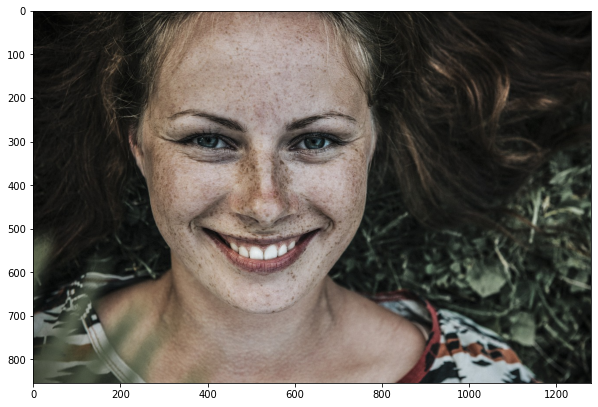

In [12]:
# Reconhecimento de face
url_img = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_5/imagens/px-woman-smilings.jpg'

imagem = io.imread(url_img)
plt.figure(figsize=(10,10))
plt.imshow(imagem)

**DLIB**

Ele tem 2 classificadores pré-treinados. 

* 68 pontos: 
* 5 pontos: bem rápido


- https://pyimagesearch.com/2017/04/03/facial-landmarks-dlib-opencv-python/

In [13]:
!wget "https://github.com/tzutalin/dlib-android/blob/master/data/shape_predictor_68_face_landmarks.dat?raw=true"

classificar_dlib_68_path = '/content/shape_predictor_68_face_landmarks.dat?raw=true'
classificar_dlib = dlib.shape_predictor(classificar_dlib_68_path)
detector_face = dlib.get_frontal_face_detector()

--2022-10-14 16:33:02--  https://github.com/tzutalin/dlib-android/blob/master/data/shape_predictor_68_face_landmarks.dat?raw=true
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/tzutalin/dlib-android/raw/master/data/shape_predictor_68_face_landmarks.dat [following]
--2022-10-14 16:33:02--  https://github.com/tzutalin/dlib-android/raw/master/data/shape_predictor_68_face_landmarks.dat
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/tzutalin/dlib-android/master/data/shape_predictor_68_face_landmarks.dat [following]
--2022-10-14 16:33:02--  https://raw.githubusercontent.com/tzutalin/dlib-android/master/data/shape_predictor_68_face_landmarks.dat
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.19

* face_recognition.face_landmarks

In [14]:
# Retangulo de identificação
def anotar_rosto(imagem):
    retangulos = detector_face(imagem, 1)  # 1 não terá rostos menores
    if len(retangulos) == 0:
        return None
    
    for k, d in enumerate(retangulos):
        print('Identificado rosto '+ str(k))
        cv2.rectangle(imagem, (d.left(), d.top()), (d.right(), d.bottom()),
                      (255, 255, 0), 2)

    return imagem    

In [15]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

Identificado rosto 0


O rosto 0 refere-se ao primeiro rosto

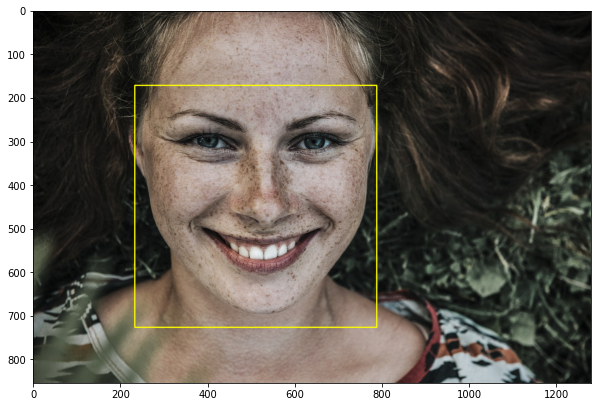

In [16]:
plt.figure(figsize=(10,10))
plt.imshow(imagem_anotada)

### HOG - Histogram of Oriented Gradient

Através da janela deslizante é identificado os sentido dos gradientes, criando um vetor com a direção dos gradientes, permitindo identificar os contornos da imagem.

In [32]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)
    if len(retangulos) == 0:
        return None

    marcos = []
    for ret in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificar_dlib(imagem, ret).parts()]))
    return marcos

In [33]:
marcos_faciais = pontos_marcos_faciais(imagem)
marcos_faciais

[matrix([[339, 403],
         [347, 445],
         [357, 485],
         [374, 525],
         [399, 564],
         [429, 601],
         [463, 633],
         [502, 662],
         [546, 665],
         [592, 650],
         [632, 614],
         [665, 572],
         [689, 526],
         [703, 476],
         [702, 423],
         [694, 369],
         [684, 314],
         [336, 400],
         [344, 373],
         [371, 363],
         [401, 364],
         [431, 368],
         [463, 355],
         [493, 330],
         [529, 314],
         [567, 312],
         [599, 329],
         [450, 378],
         [455, 406],
         [460, 436],
         [466, 466],
         [444, 478],
         [461, 486],
         [482, 489],
         [503, 475],
         [521, 460],
         [376, 403],
         [389, 393],
         [404, 388],
         [424, 388],
         [409, 393],
         [393, 398],
         [508, 367],
         [522, 357],
         [539, 352],
         [561, 352],
         [543, 356],
         [526

In [19]:
len(marcos_faciais)

1

In [20]:
len(marcos_faciais[0])

68

In [21]:
# Plot dos pontos
def anotar_marcos_faciais(imagem, marcos):
    for marco in marcos:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            cv2.circle(imagem, centro, 3, [255,255,0], -1)  # -1 perímetro
            cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, [255,255,255], 2)
    return imagem

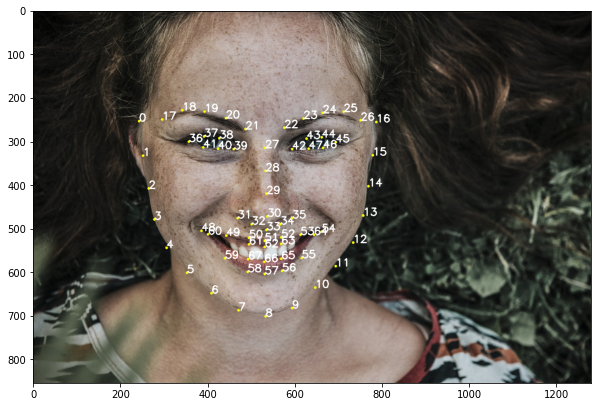

In [22]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

plt.figure(figsize=(10,10))
plt.imshow(imagem_anotada)

Identificado rosto 0


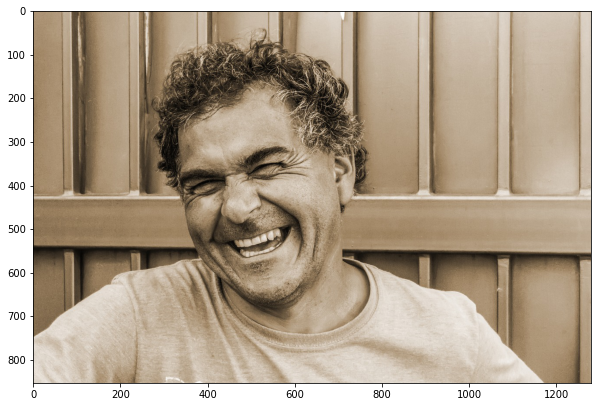

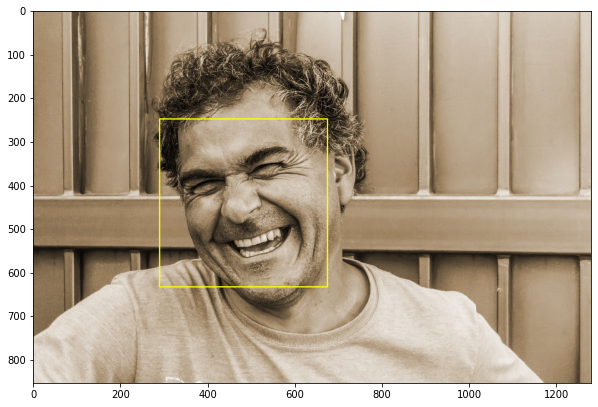

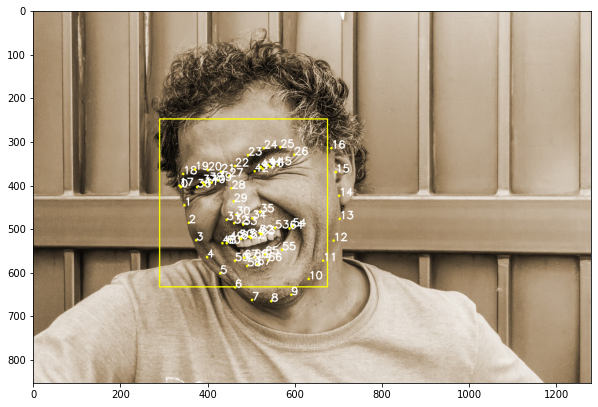

In [23]:
# Reconhecimento de face
url_img = 'https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_5/imagens/px-man-happy.jpg'

imagem = io.imread(url_img)
plt.figure(figsize=(10,10))
plt.imshow(imagem)

# [...]
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

plt.figure(figsize=(10,10))
plt.imshow(imagem_anotada)

marcos_faciais = pontos_marcos_faciais(imagem)
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

plt.figure(figsize=(10,10))
plt.imshow(imagem_anotada)

### Medidas de Aspectos de Razão

Através do aspecto dos marcos faciais é possível identificar a condição daface humana.

As medidas de aspectos de razão são uma estratégia para minimizar o impacto da escala para a identificação do aspecto dos marcos faciais.

Com ela, busca-se analisar cada região do rosto com uma medida que não varie tanto com o tamanho do rosto, ou a escala.

> aspecto de razão utilizam uma razão entre duas medidas, por exemplo comprimento e altura. Com isso, é possível lidar com aproximação ou afastamento da câmera sem maiores distorções. Aplicar aspecto de razão dos pontos mais extremos no eixo y e eixo x.

Medidas de aspecto de razão também são conhecidas por medidas de proporção. Em geometria, utilizamos esse conceito para verificar proporcionalidade. Um exemplo do nosso dia-a-dia são as TVs. A maioria usa aspecto de razão 16:9, independente do tamanho dela, das menores às maiores. Pois se dividir o comprimento pela altura, sempre vai resultar na razão 16 sobre 9.

Tanto o comprimento quanto a altura podem ser extraídos por meio de uma distância euclidiana. Essa distância é a reta que interliga duas extremidades de pontos, é com esta distância que realizamos a razão das medidas.

Em visão computacional, utilizamos este artifício para diminuir a influência de escala da captação da imagem, pois com medidas de razão as faixas de variação são bem menores.

Se você se aproximar ou se afastar de uma câmera e calcular a área, por exemplo da boca, os valores aumentam ou diminuem, no mínimo, entre 50, 80 ou até mesmo 100%, uma variação extremamente grande que dificulta a aplicação na maioria dos casos de uso.

**Aspecto de razão de olhos**

Lidar com diferentes dimensões é um desafio que onde precisamos aplicar alguns conceitos de geometria para poder identificar algumas condições em um rosto, como um sorriso, olhos fechados ou até mesmo como saber se a pessoa está bocejando.

Diferentemente de aplicações geométricas que envolvem aspecto de razão, neste caso vamos utilizar um conjunto de distâncias entre diferentes pontos.

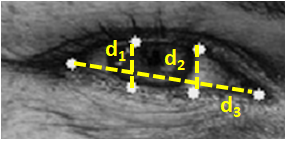

No caso dos olhos, a fórmula que usamos é somatória da distância d1 e d2 dividido pelo d3 vezes 2. As distâncias d1, d2 e d3 são euclidianas calculadas a partir dos pontos obtidos pelos marcos faciais.

Aspecto de razão envolve, por regra, uma distância sobre outra, porém a distância tanto d1 quanto d2 são importantes para captar o fechamento ou abertura dos olhos. Por tal motivo é que compensamos as duas medidas incluindo o valor 2 no denominador, junto com a distância d3. Essa fórmula foi retirada do paper de Soukupova e Cech.

Caso tenha interesse em saber mais sobre o assunto, existe uma [técnica publicada por Soukupova e Cech](http://vision.fe.uni-lj.si/cvww2016/proceedings/papers/05.pdf) relacionada aos pontos das extremidades de um dado conjunto, em especial dos olhos, que é capaz de lidar com diferentes tamanhos de imagem, mas preservando um valor global independente. Ou seja, podemos definir um limiar que mesmo que um rosto esteja mais perto da câmera ou mais longe, o valor será o mesmo.

#### Identificação das partes

In [24]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
NARIZ = list(range(27,35))
MANDIBULA = list(range(0,17))
LABIO = list(range(48, 61))

SOMBRANCELHA_DIRETA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36,42))
OLHO_ESQUERDO = list(range(42,48))

In [25]:
from scipy.spatial import distance as dist

In [26]:
def aspecto_razao_olhos(pontos_olhos):
    a = dist.euclidean(pontos_olhos[1], pontos_olhos[5])
    b = dist.euclidean(pontos_olhos[2], pontos_olhos[4])
    c = dist.euclidean(pontos_olhos[0], pontos_olhos[3])
    
    aspecto_razao = (a + b)/(2.0 * c)
    
    return aspecto_razao

In [27]:
def anotar_marcos_casca_convexa(imagem, marcos):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
        
        pontos = cv2.convexHull(marco[OLHO_DIREITO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
    
    return imagem

In [49]:
def anotar_marcos_casca_convexa_boca(imagem, marcos):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[LABIO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)

    return imagem

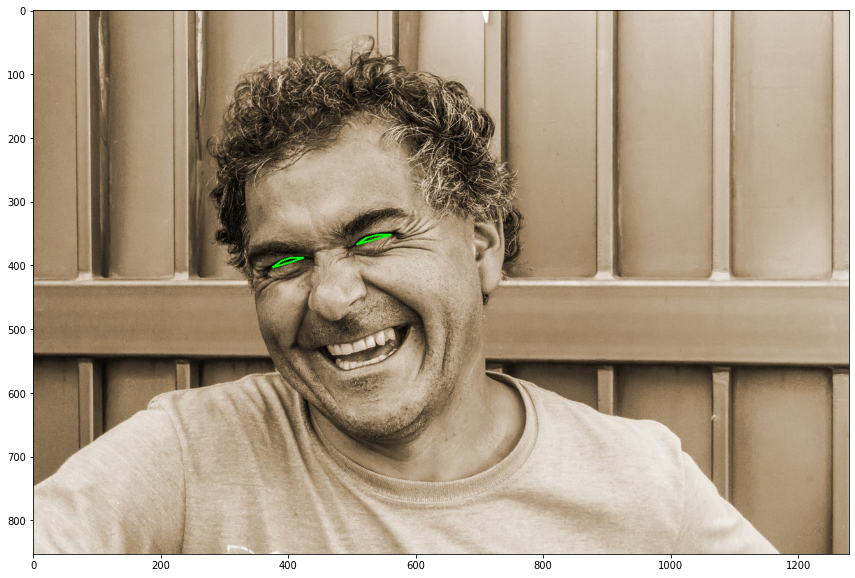

In [28]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)

plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

#### Cálculo das medidas de aspecto de razão



In [29]:
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
valor_olho_esquerdo

0.10269923319261938

In [30]:
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
valor_olho_direito

0.13396715136722953

Valor do olho esquerdo 0.2746511084931829
Valor do olho direito 0.2622183488068983


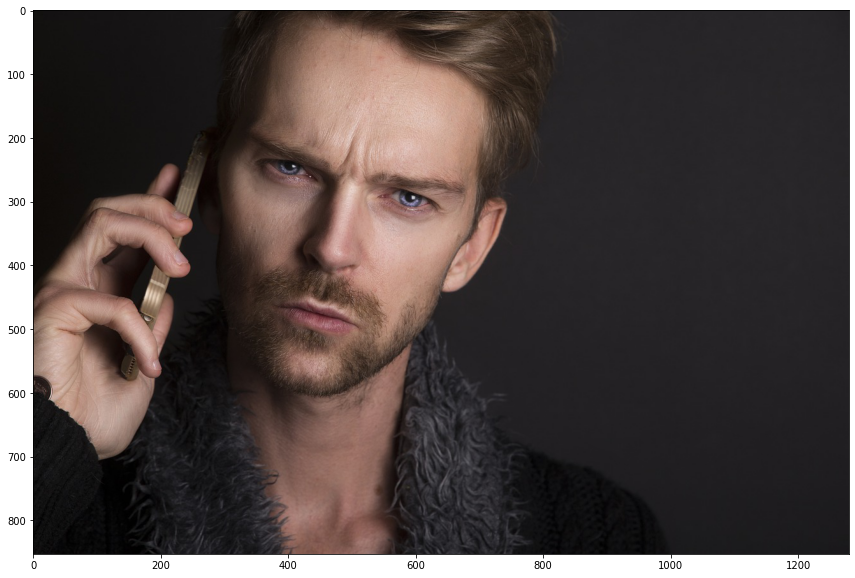

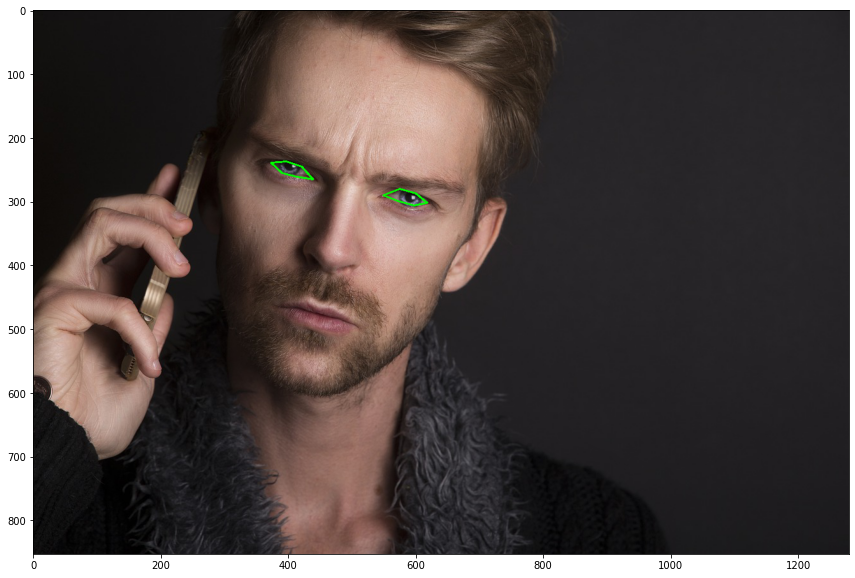

In [35]:
# Comparação com outra imagem
url_img = "https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_5/imagens/px-man-serious.jpg"
imagem_pessoa_seria = io.imread(url_img)
plt.figure(figsize=(20,10))
plt.imshow(imagem_pessoa_seria)

# Marcos faciais
marcos_faciais = pontos_marcos_faciais(imagem_pessoa_seria)

imagem_anotada = imagem_pessoa_seria.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

# Medidas de Aspectos de Razão
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
print('Valor do olho esquerdo',valor_olho_esquerdo)
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
print('Valor do olho direito',valor_olho_direito)

# Exemplo 5


Primeiramente, vamos utilizar os trechos de código para exibir a captura da câmera no Notebook.

In [ ]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (800,600))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)


In [ ]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")


classificador_dlib_68_pontos = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_pontos)
detector_face = dlib.get_frontal_face_detector()



In [ ]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
        return None

    marcos = []

    for retangulo in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, retangulo).parts()]))

    return marcos

In [ ]:
def anotar_marcos_faciais(imagem, marcos_faciais):
    if imagem is None:
        return im

    for marco in marcos_faciais:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0, 0], ponto[0, 1])
            cv2.circle(imagem, centro, 3, color=(255, 255, 0), thickness=-1)
    return imagem

In [ ]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            frame = anotar_marcos_faciais(frame, pontos)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")


FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))




In [ ]:
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(pontos_boca[3], pontos_boca[9])
    b = dist.euclidean(pontos_boca[2], pontos_boca[10])
    c = dist.euclidean(pontos_boca[4], pontos_boca[8])
    d = dist.euclidean(pontos_boca[0], pontos_boca[6])
    aspecto_razao = (a + b + c)/(3.0 * d)
    return aspecto_razao

Arredondei para 3 casas decimais o valor de aspecto de razão, para não ficar muito grande na leitura em tela.

Note que peguei o primeiro ponto dos lábios e usei como referência para escrever o valor em tela.

Usei o método A1 do numpy para converter em array somente o primeiro par de pontos, depois converti para uma tupla para enfim usar como parâmetro x e y do putText. Assim o valor fica logo abaixo da boca, por isso que coloquei a margem de 20 pixels.

In [ ]:
captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            if pontos is not None:
                frame = anotar_marcos_faciais(frame, pontos)
                pontos = pontos[0]
                ar = aspecto_razao_boca(pontos[LABIO])
                ar = round(ar,3)
                coord = tuple(pontos[LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 20)
                cv2.putText(frame, "Aspecto Razao " + str(ar), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Faça um teste e veja o valor para sua boca de abertura que conseguiu obter. No meu caso, chegou aproximadamente em 0,5.

Com isso, se a medida de aspecto de razão for maior que 0,5, vamos desenhar um retângulo.

Para desenhar o retângulo tendo como base os pontos da boca, utilizamos o método boudingRect([pontos]).

Depois, com as coordenadas, desenhamos o retângulo, ficando desta forma:

In [ ]:
if ar > 0.5:
    (x, y, w, h) = cv2.boundingRect(pontos[LABIO])
    frame = cv2.rectangle(frame, (x,y), (x+w,y+h), (255,255,0), 2)

captura_video = cv2.VideoCapture(0)

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)
            if pontos is not None:
                frame = anotar_marcos_faciais(frame, pontos)
                pontos = pontos[0]
                ar = aspecto_razao_boca(pontos[LABIO])
                ar = round(ar,3)

                if ar > 0.5:
                    (x, y, w, h) = cv2.boundingRect(pontos[LABIO])
                    frame = cv2.rectangle(frame, (x,y), (x+w,y+h), (255,255,0), 2)

                coord = tuple(pontos[LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 20)
                cv2.putText(frame, "Aspecto Razao " + str(ar), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

## 7 - Aplicação

In [38]:
def padronizar_imagem(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (500, 400))
    return frame

In [39]:
def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [40]:
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(pontos_boca[3], pontos_boca[9])
    b = dist.euclidean(pontos_boca[2], pontos_boca[10])
    c = dist.euclidean(pontos_boca[4], pontos_boca[8])
    d = dist.euclidean(pontos_boca[0], pontos_boca[6])
    
    aspecto_razao = (a + b + c)/(3.0*d)
    
    return aspecto_razao

In [47]:
# TESTE 1 - 
!wget "https://github.com/alura-cursos/alura-analise-facial/blob/aula_6/videos/expressoes.mov?raw=true"
!wget "https://github.com/alura-cursos/alura-analise-facial/blob/aula_6/videos/bocejo.mov?raw=true"
!wget "https://github.com/alura-cursos/alura-analise-facial/blob/aula_6/videos/olhos-fechados.mov?raw=true"


--2022-10-14 17:34:04--  https://github.com/alura-cursos/alura-analise-facial/blob/aula_6/videos/expressoes.mov?raw=true
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/alura-cursos/alura-analise-facial/raw/aula_6/videos/expressoes.mov [following]
--2022-10-14 17:34:04--  https://github.com/alura-cursos/alura-analise-facial/raw/aula_6/videos/expressoes.mov
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_6/videos/expressoes.mov [following]
--2022-10-14 17:34:04--  https://raw.githubusercontent.com/alura-cursos/alura-analise-facial/aula_6/videos/expressoes.mov
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubuserco

**Exemplo de reprodução de vídeo**

In [46]:
video = cv2.VideoCapture("/content/expressoes.mov?raw=true")

try:
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


**Identificação de abertura da boca**

Isso pode ser importante para avaliar a atenção das pessoas, em entrevistas ou atividades de alta atenção.

Com a identificação da abertura da boca é possível avaliar o momento em que a pessoa realizar a abertura, reduzindoo tempo de visualização do período todo.

In [52]:
try:
    ar_max = 0
    video = cv2.VideoCapture("/content/bocejo.mov?raw=true")
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            marcos_faciais = pontos_marcos_faciais(frame)
            
            if marcos_faciais is not None:
                ar_boca = aspecto_razao_boca(marcos_faciais[0][LABIO])
                ar_boca = round(ar_boca, 3)
                
                if ar_boca > ar_max:
                    ar_max = ar_boca
                
                info = "boca " + str(ar_boca) + " maximo " + str(ar_max)
                
                frame = anotar_marcos_casca_convexa_boca(frame, marcos_faciais)
                cv2.putText(frame, info, (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            
            exibir_video(frame)
            
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


**Identificação de abetura do olho**



In [51]:
try:
    min_olho_esq = 1
    min_olho_dir = 1
    
    video = cv2.VideoCapture("/content/olhos-fechados.mov?raw=true")
    
    while(True):
        captura_ok, frame = video.read()
        frame = padronizar_imagem(frame)
        
        marcos_faciais = pontos_marcos_faciais(frame)
        
        if marcos_faciais is not None:
            ar_olho_esq = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
            ar_olho_dir = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
            
            ar_olho_esq = round(ar_olho_esq, 3)
            ar_olho_dir = round(ar_olho_dir, 3)
            
            if ar_olho_esq < min_olho_esq:
                min_olho_esq = ar_olho_esq
                
            if ar_olho_dir < min_olho_dir:
                min_olho_dir = ar_olho_dir
            
            info_oe = "olho esquerdo " + str(ar_olho_esq) + " minimo " + str(min_olho_esq)
            info_od = "olho direito " + str(ar_olho_dir) + " minimo " + str(min_olho_dir)
            
            frame = anotar_marcos_casca_convexa(frame, marcos_faciais)
            
            cv2.putText(frame, info_oe, (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            cv2.putText(frame, info_od, (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            
        exibir_video(frame)
        
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


Aplicações que lidam com monitoramento por câmeras realizam o tratamento de vídeo em tempo real, diferentemente de uma análise de imagem única. Dependendo da taxa de quadros por segundo, podemos ter até mesmo 60 imagens por segundo.

Considerando que uma aplicação analisa faces por vídeo para alertar quando um indivíduo estranho se aproxima no local, e a câmera está fixada num local onde é possível focalizar, ainda que longe o rosto das pessoas que chegam a entrada do prédio, como na imagem abaixo.

A estratégia tem as diretrizes correta

* a coleta periódica, de 0,5 segundos 
* extração somente da região de interesse. Isso tornará a identificação rápida o suficiente para a tomada de decisões sem onerar os custos de implementação.

# Exemplo 6

Vamos construir, com base na análise de um vídeo, quantas vezes a pessoa que está nele bocejou, e criar um contador que exiba esta informação em tela.

Usaremos DLib para identificar e extrair os marcos faciais para que seja possível realizar nossa análise num rosto identificável no vídeo.


In [ ]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

def padronizar_imagem(imagem):
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem = cv2.resize(imagem, (800,600))
    return imagem

def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

Nosso próximo passo é aplicar estas funções para exibir o vídeo no Notebook. Repare que na função padronizar_imagem você pode alterar o tamanho da imagem caso fique muito pequeno ou muito grande no seu computador.

Agora vamos abrir o vídeo.

Para abrir um vídeo, em vez de passarmos um número que indicaria uma câmera conectada no construtor do cv2.VideoCapture, vamos passar o caminho de onde o vídeo foi salvo.

In [ ]:
captura_video = cv2.VideoCapture("videos/bocejo.mov")

try:
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

classificador_dlib_68_pontos = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_pontos)
detector_face = dlib.get_frontal_face_detector()

FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))
```

E em seguida, a função que retorna os pontos dos marcos faciais.

```
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)

    if len(retangulos) == 0:
        return None

    marcos = []

    for retangulo in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, retangulo).parts()]))

    return marcos


def anotar_marcos_faciais(imagem, marcos_faciais):
    if imagem is None:
        return im

    for marco in marcos_faciais:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0, 0], ponto[0, 1])
            cv2.circle(imagem, centro, 3, color=(255, 255, 0), thickness=-1)
    return imagem

def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(pontos_boca[3], pontos_boca[9])
    b = dist.euclidean(pontos_boca[2], pontos_boca[10])
    c = dist.euclidean(pontos_boca[4], pontos_boca[8])
    d = dist.euclidean(pontos_boca[0], pontos_boca[6])
    aspecto_razao = (a + b + c)/(3.0 * d)
    return aspecto_razao


captura_video = cv2.VideoCapture("videos/bocejo.mov")

try:
    aspecto_razao_max = 0
    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)

            pontos = pontos_marcos_faciais(frame)
            if pontos is not None:

                aspecto_razao = aspecto_razao_boca(pontos[0][LABIO])
                aspecto_razao = round(aspecto_razao, 3)

                if aspecto_razao > aspecto_razao_max:
                    aspecto_razao_max = aspecto_razao

                aspecto_razao_info = "aspecto razao " + str(aspecto_razao) + " maximo " + str(aspecto_razao_max)

                frame = anotar_marcos_faciais(frame, pontos)

                coord = tuple(pontos[0][LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 20)

                cv2.putText(frame, aspecto_razao_info, coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")

Em tela, neste exemplo, o bocejo foi identificado com valor de aspecto de razão de aproximadamente 1,15. Vamos utilizar esse valor como gatilho.

No código aprimorado, note que incluímos a lógica de verificação de um bocejo a partir de um determinado limiar, e também uma comparação com o estado anterior (de não ter bocejado) para contabilizarmos a conta.

Incluí a quantidade de bocejos logo abaixo do texto do valor de aspecto de razão da boca, na cor vermelha, para destacar um pouco mais.

In [ ]:
captura_video = cv2.VideoCapture("videos/bocejo.mov")

try:
    aspecto_razao_max = 0
    qtde_bocejo = 0

    bocejo = False
    bocejo_anterior = False

    while(True):
        captura_ok, frame = captura_video.read()

        if captura_ok:
            frame = padronizar_imagem(frame)
            pontos = pontos_marcos_faciais(frame)

            if pontos is not None:

                aspecto_razao = aspecto_razao_boca(pontos[0][LABIO])
                aspecto_razao = round(aspecto_razao, 3)

                if aspecto_razao > aspecto_razao_max:
                    aspecto_razao_max = aspecto_razao

                aspecto_razao_info = "aspecto razao " + str(aspecto_razao) + " maximo " + str(aspecto_razao_max)

                frame = anotar_marcos_faciais(frame, pontos)

                coord = tuple(pontos[0][LABIO][0].A1.reshape(1, -1)[0])
                coord = (coord[0], coord[1] + 20)

                cv2.putText(frame, aspecto_razao_info, coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)

                if aspecto_razao > 1.15:
                    bocejo = True
                else:
                    bocejo = False

                if bocejo_anterior == False and bocejo == True:
                    qtde_bocejo += 1

                coord = (coord[0], coord[1] + 23)
                cv2.putText(frame, "bocejos " + str(qtde_bocejo), coord, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)

                bocejo_anterior = bocejo

            exibir_video(frame)

except KeyboardInterrupt:
    captura_video.release()
    print("Interrompido")